In [1]:
import numpy as np
import pandas as pd
import os
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
import time
import tqdm
from PIL import Image

SEED = 118
print(os.listdir('../input/aptos2019-blindness-detection/'))

['train.csv', 'train_images', 'test_images', 'test.csv', 'sample_submission.csv']


In [2]:
train = pd.read_csv('../input/aptos2019-blindness-detection/train.csv')
test = pd.read_csv('../input/aptos2019-blindness-detection/test.csv')
submission = pd.read_csv('../input/aptos2019-blindness-detection/sample_submission.csv')

In [3]:
# データサイズ
print('トレーニングデータ: ', train.shape)
print('テストデータ: ', test.shape)
print('提出用データ: ', submission.shape)

トレーニングデータ:  (3662, 2)
テストデータ:  (1928, 1)
提出用データ:  (1928, 2)


In [4]:
train.head()

,id_code,diagnosis
0,000c1434d8d7,2
1,001639a390f0,4
2,0024cdab0c1e,1
3,002c21358ce6,0
4,005b95c28852,0


In [5]:
test.head()

,id_code
0,0005cfc8afb6
1,003f0afdcd15
2,006efc72b638
3,00836aaacf06
4,009245722fa4


画像pathは'../input/aptos2019-blindness-detection/train_images/{id_code}.png'で与えられているので、
例えば、'000c1434d8d7'のpathは以下のようになる<br>
'../input/aptos2019-blindness-detection/train_images/000c1434d8d7.png'

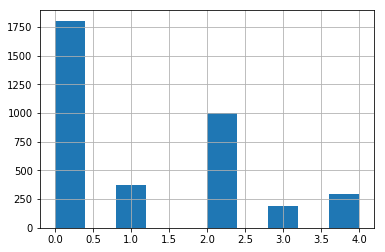

In [6]:
train.diagnosis.hist()

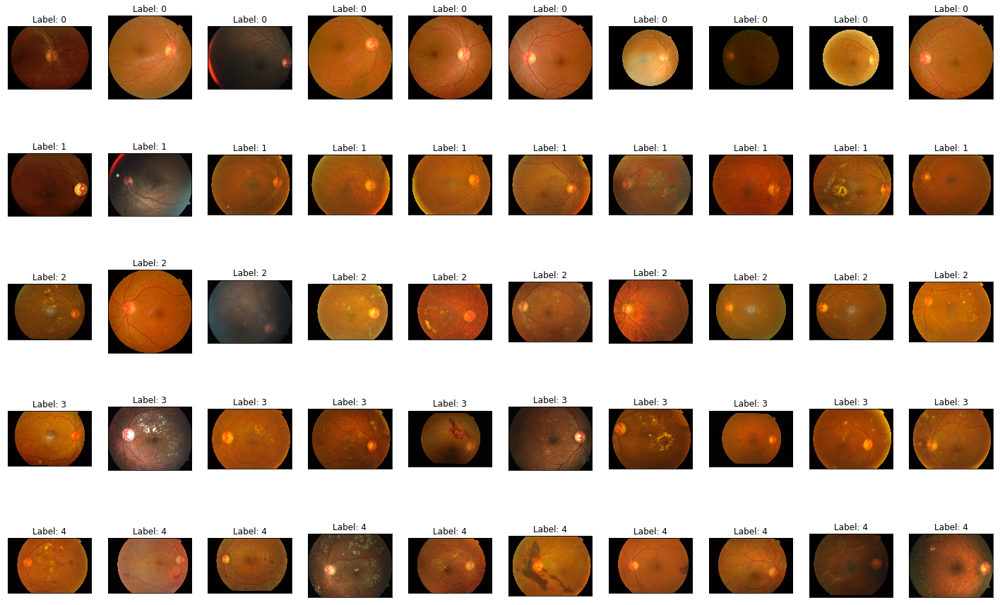

In [7]:
fig = plt.figure(figsize=(25, 16))
for class_ids in sorted(train['diagnosis'].unique()):
    for i, (idx, row) in enumerate(train.loc[train.diagnosis==class_ids].sample(10, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, 10, class_ids*10+i+1, xticks=[], yticks=[])
        im = Image.open(f'../input/aptos2019-blindness-detection/train_images/{row["id_code"]}.png')
        plt.imshow(im)
        ax.set_title(f'Label: {class_ids}')

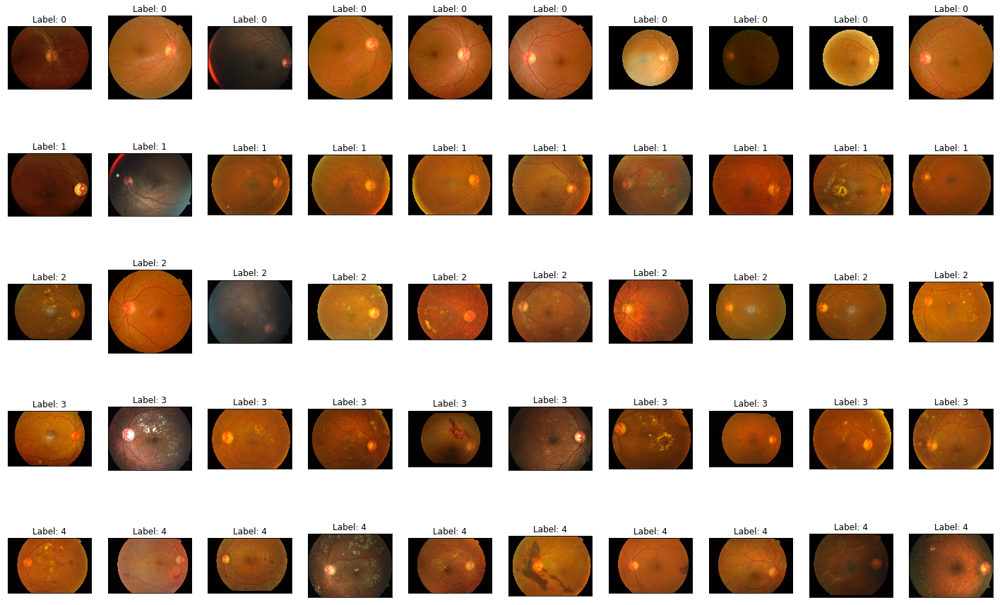

In [8]:
fig = plt.figure(figsize=(25, 16))
for class_ids in sorted(train['diagnosis'].unique()):
    for i, (idx, row) in enumerate(train.loc[train.diagnosis==class_ids].sample(10, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, 10, class_ids*10+i+1, xticks=[], yticks=[])
        im = cv2.imread(f'../input/aptos2019-blindness-detection/train_images/{row["id_code"]}.png')
        im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
        plt.imshow(im)
        ax.set_title(f'Label: {class_ids}')

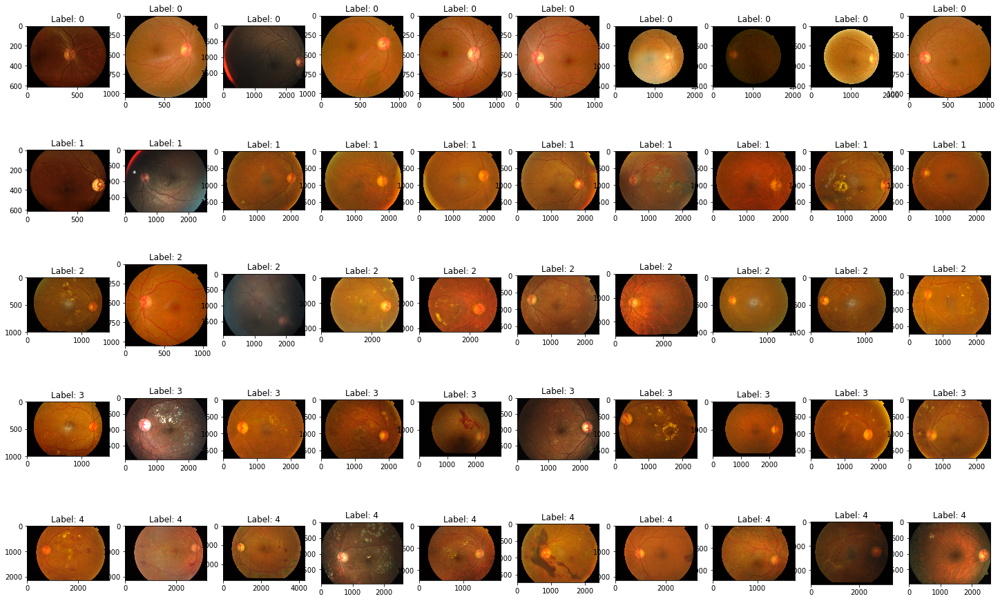

In [9]:
# 画像の表示領域のサイズを指定し、インスタンスを作成
fig = plt.figure(figsize=(25, 16))

# ラベル(0~4それぞれ)ごとに10個のサンプルを取り出し表示する
# trainのdiagnosisのuniqueな値を取り出してループを回す
for class_ids in sorted(train['diagnosis'].unique()):
    # ラベルを指定し、10個のサンプルを取り出す
    # random_stateで最初に指定したSEEDを指定することで、何回実行しても同じ画像が取り出すことができます
    for i, (idx, row) in enumerate(train.loc[train.diagnosis==class_ids].sample(10, random_state=SEED).iterrows()):
        # add_subplotに行数(=5)、列数(=10)を指定
        # class_ids*10+i+1番目に読み込んだ画像が表示される
        ax = fig.add_subplot(5, 10, class_ids*10+i+1)
        im = cv2.imread(f'../input/aptos2019-blindness-detection/train_images/{row["id_code"]}.png')
        im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
        plt.imshow(im)
        ax.set_title(f'Label: {class_ids}')

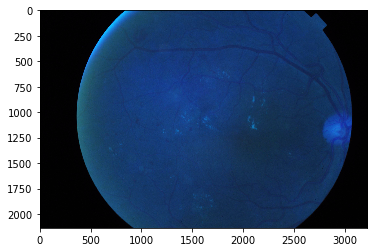

In [10]:
im = cv2.imread('../input/aptos2019-blindness-detection/train_images/000c1434d8d7.png')
plt.imshow(im)

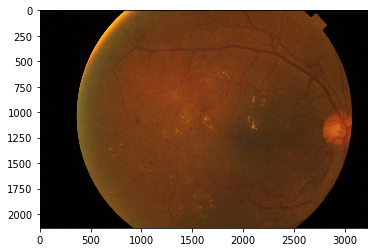

In [11]:
img = cv2.imread('../input/aptos2019-blindness-detection/train_images/000c1434d8d7.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

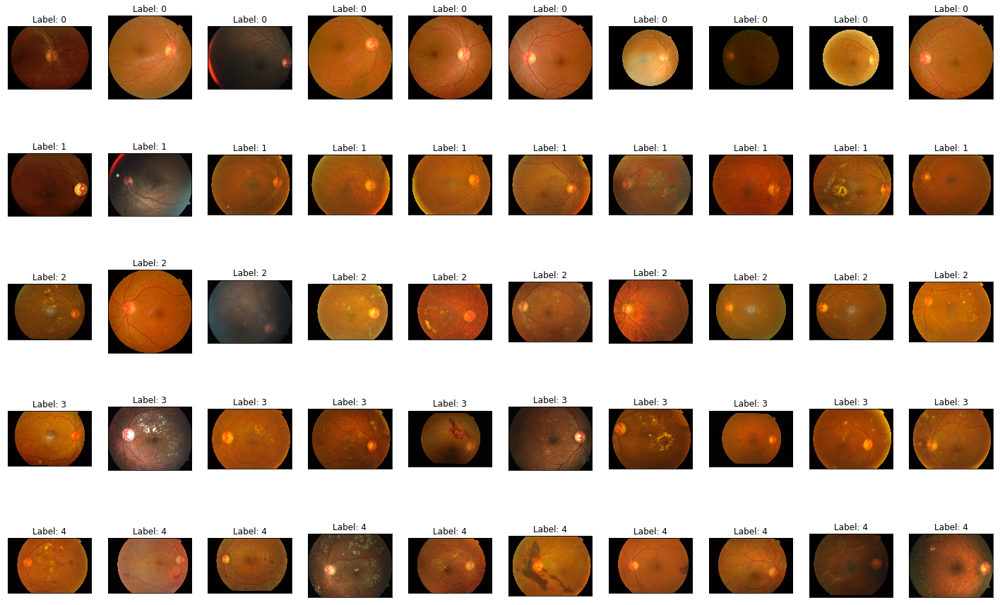

In [12]:
fig = plt.figure(figsize=(25, 16))
for class_ids in sorted(train['diagnosis'].unique()):
    for i, (idx, row) in enumerate(train.loc[train.diagnosis==class_ids].sample(10, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, 10, class_ids*10+i+1, xticks=[], yticks=[])
        im = cv2.imread(f'../input/aptos2019-blindness-detection/train_images/{row["id_code"]}.png')
        im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
        plt.imshow(im)
        ax.set_title(f'Label: {class_ids}')

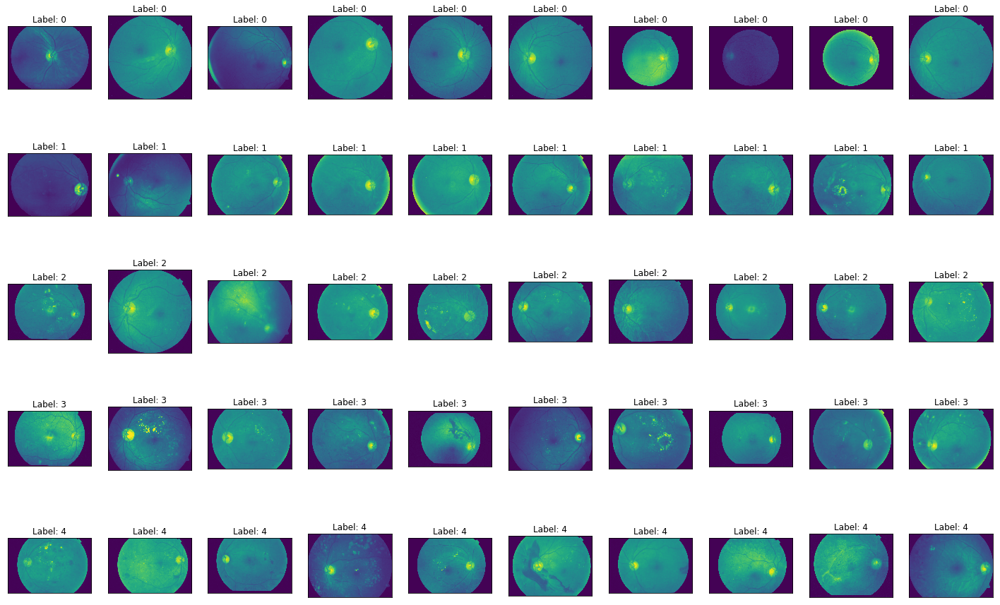

In [13]:
fig = plt.figure(figsize=(25, 16))
for class_ids in sorted(train['diagnosis'].unique()):
    for i, (idx, row) in enumerate(train.loc[train.diagnosis==class_ids].sample(10, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, 10, class_ids*10+i+1, xticks=[], yticks=[])
        im = cv2.imread(f'../input/aptos2019-blindness-detection/train_images/{row["id_code"]}.png')
        im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
        plt.imshow(im)
        ax.set_title(f'Label: {class_ids}')

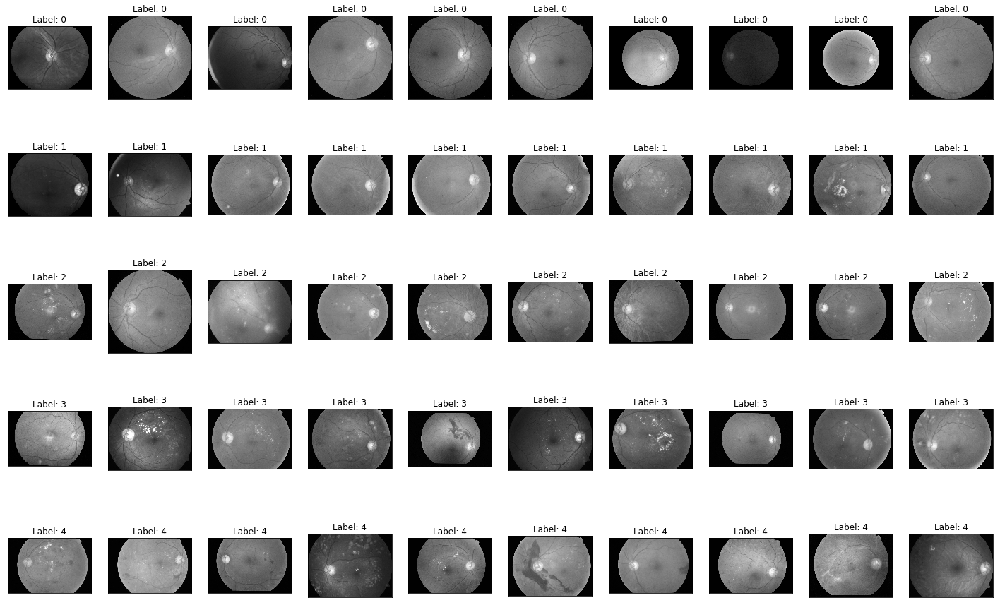

In [14]:
fig = plt.figure(figsize=(25, 16))
for class_ids in sorted(train['diagnosis'].unique()):
    for i, (idx, row) in enumerate(train.loc[train.diagnosis==class_ids].sample(10, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, 10, class_ids*10+i+1, xticks=[], yticks=[])
        im = cv2.imread(f'../input/aptos2019-blindness-detection/train_images/{row["id_code"]}.png')
        im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
        plt.imshow(im, cmap='gray')
        ax.set_title(f'Label: {class_ids}')

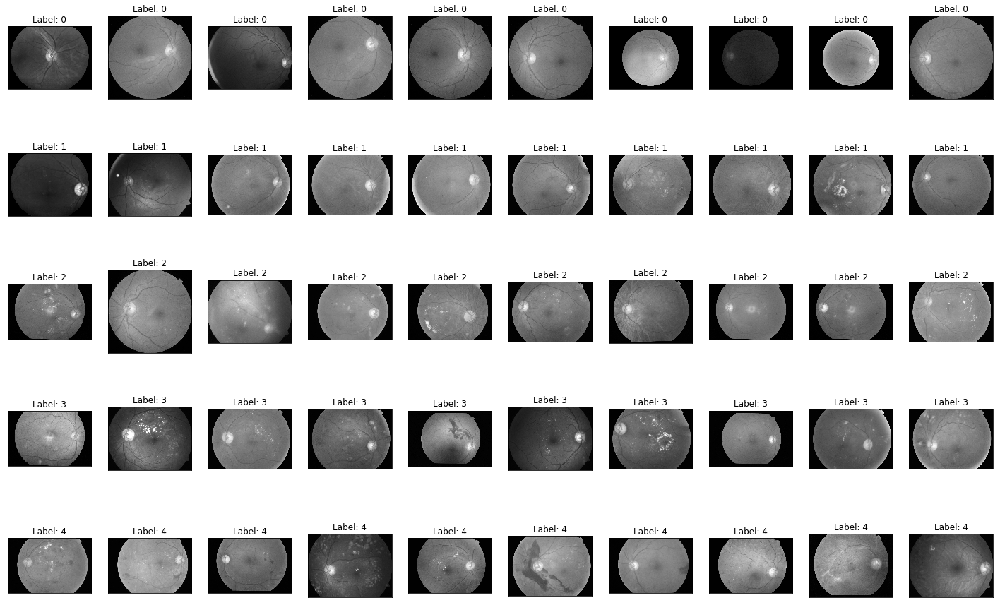

In [15]:
fig = plt.figure(figsize=(25, 16))
for class_ids in sorted(train['diagnosis'].unique()):
    for i, (idx, row) in enumerate(train.loc[train.diagnosis==class_ids].sample(10, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, 10, class_ids*10+i+1, xticks=[], yticks=[])
        im = cv2.imread(f'../input/aptos2019-blindness-detection/train_images/{row["id_code"]}.png')
        im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
        plt.imshow(im, cmap='gray')
        ax.set_title(f'Label: {class_ids}')

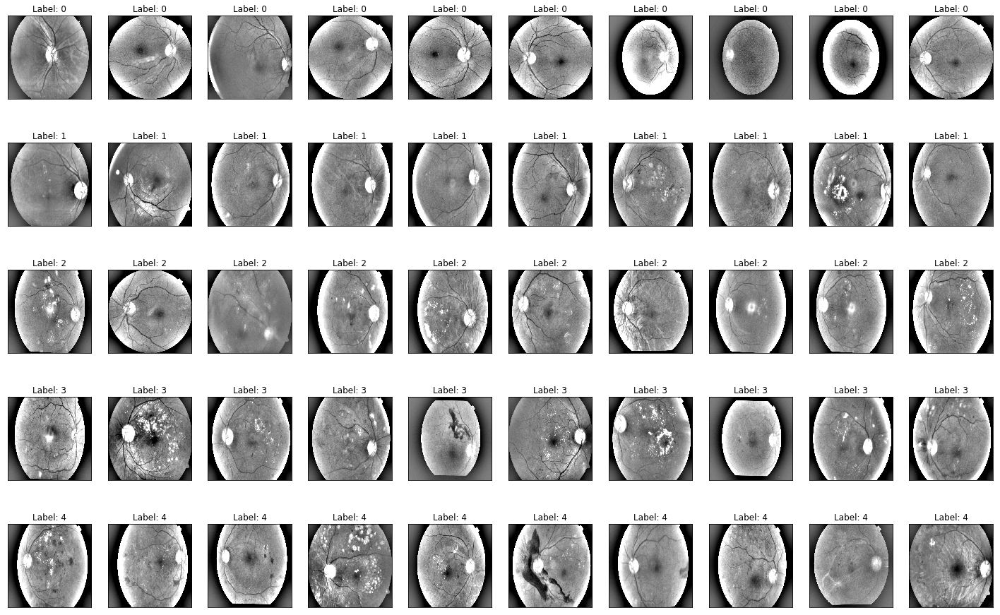

In [16]:
# GaussianBlurで平滑化？変換する
IMG_SIZE = 512
fig = plt.figure(figsize=(25, 16))
for class_ids in sorted(train['diagnosis'].unique()):
    for i, (idx, row) in enumerate(train.loc[train.diagnosis==class_ids].sample(10, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, 10, class_ids*10+i+1, xticks=[], yticks=[])
        im = cv2.imread(f'../input/aptos2019-blindness-detection/train_images/{row["id_code"]}.png')
        im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
        im = cv2.resize(im, (IMG_SIZE, IMG_SIZE))
        im = cv2.addWeighted(im, 4, cv2.GaussianBlur(im, (0, 0), IMG_SIZE/10), -4, 128)
        plt.imshow(im, cmap='gray')
        ax.set_title(f'Label: {class_ids}')

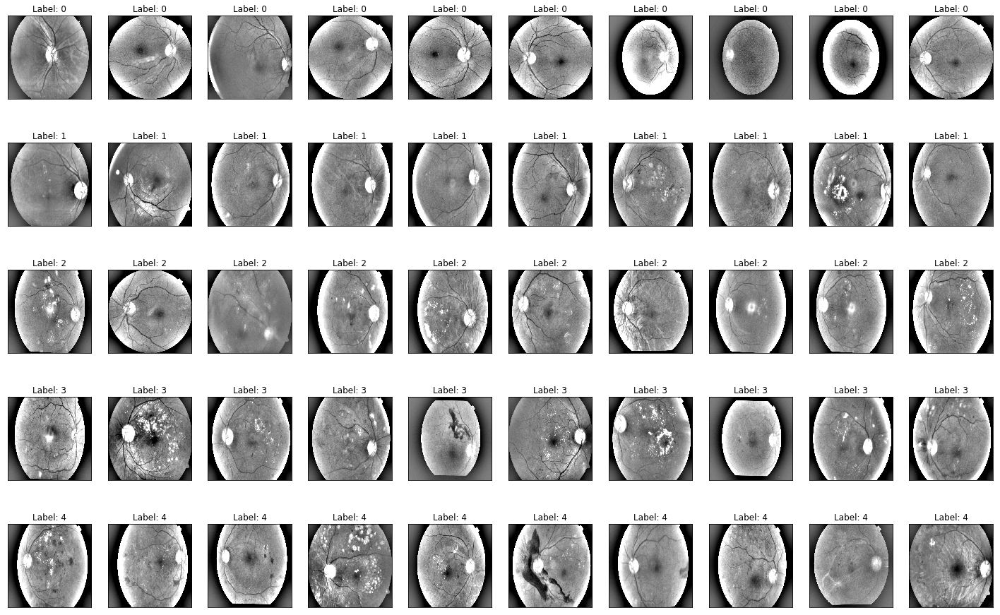

In [17]:
# GaussianBlurで輪郭強調
IMG_SIZE = 512
fig = plt.figure(figsize=(25, 16))
for class_ids in sorted(train['diagnosis'].unique()):
    for i, (idx, row) in enumerate(train.loc[train.diagnosis==class_ids].sample(10, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, 10, class_ids*10+i+1, xticks=[], yticks=[])
        im = cv2.imread(f'../input/aptos2019-blindness-detection/train_images/{row["id_code"]}.png')
        im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
        # 画像サイズを指定サイズ（=IMG_SIZE）に変更します
        im = cv2.resize(im, (IMG_SIZE, IMG_SIZE))
        # ガウシアンフィルターをかけてみます（ガウシアンフィルタは白色ノイズを除去できる）
        im = cv2.addWeighted(im, 4, cv2.GaussianBlur(im, (0, 0), IMG_SIZE/10), -4, 128)
        plt.imshow(im, cmap='gray')
        ax.set_title(f'Label: {class_ids}')

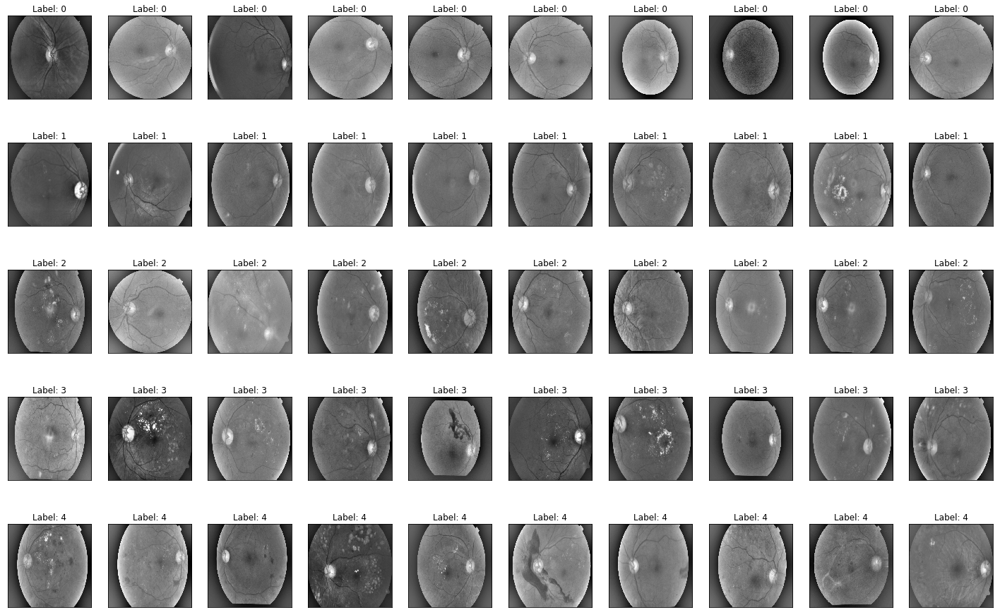

In [18]:
# GaussianBlurで輪郭強調
IMG_SIZE = 512
fig = plt.figure(figsize=(25, 16))
for class_ids in sorted(train['diagnosis'].unique()):
    for i, (idx, row) in enumerate(train.loc[train.diagnosis==class_ids].sample(10, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, 10, class_ids*10+i+1, xticks=[], yticks=[])
        im = cv2.imread(f'../input/aptos2019-blindness-detection/train_images/{row["id_code"]}.png')
        im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
        # 画像サイズを指定サイズ（=IMG_SIZE）に変更します
        im = cv2.resize(im, (IMG_SIZE, IMG_SIZE))
        # ガウシアンフィルターをかけてみます（ガウシアンフィルタは白色ノイズを除去できる）
        im = cv2.addWeighted(im, 1, cv2.GaussianBlur(im, (0, 0), IMG_SIZE/10), -1, 128)
        plt.imshow(im, cmap='gray')
        ax.set_title(f'Label: {class_ids}')

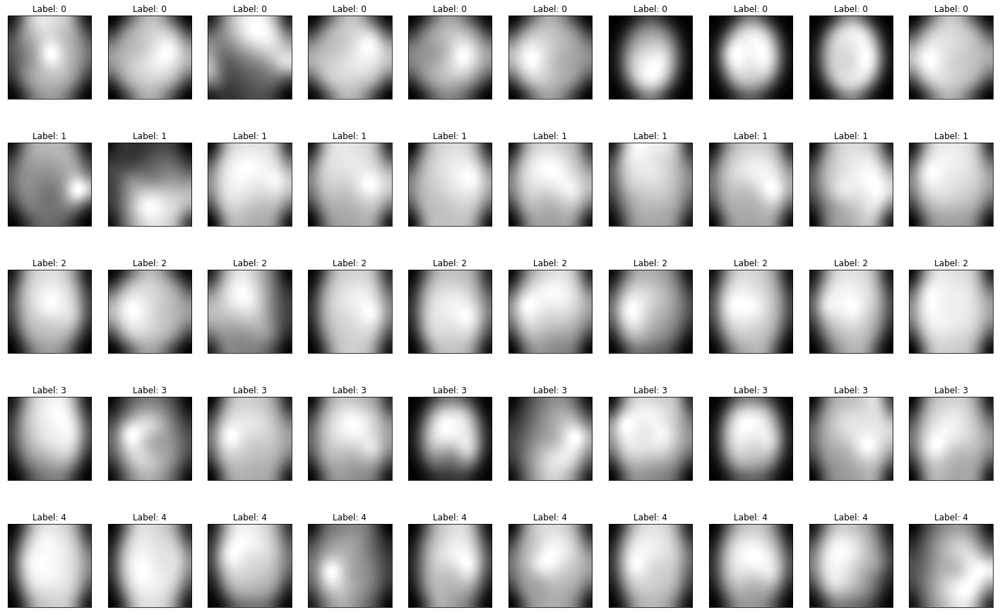

In [19]:
# GaussianBlurで輪郭強調
IMG_SIZE = 512
fig = plt.figure(figsize=(25, 16))
for class_ids in sorted(train['diagnosis'].unique()):
    for i, (idx, row) in enumerate(train.loc[train.diagnosis==class_ids].sample(10, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, 10, class_ids*10+i+1, xticks=[], yticks=[])
        im = cv2.imread(f'../input/aptos2019-blindness-detection/train_images/{row["id_code"]}.png')
        im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
        # 画像サイズを指定サイズ（=IMG_SIZE）に変更します
        im = cv2.resize(im, (IMG_SIZE, IMG_SIZE))
        # ガウシアンフィルターをかけてみます（ガウシアンフィルタは白色ノイズを除去できる）
        im = cv2.GaussianBlur(im, (0, 0), IMG_SIZE/10)
        plt.imshow(im, cmap='gray')
        ax.set_title(f'Label: {class_ids}')

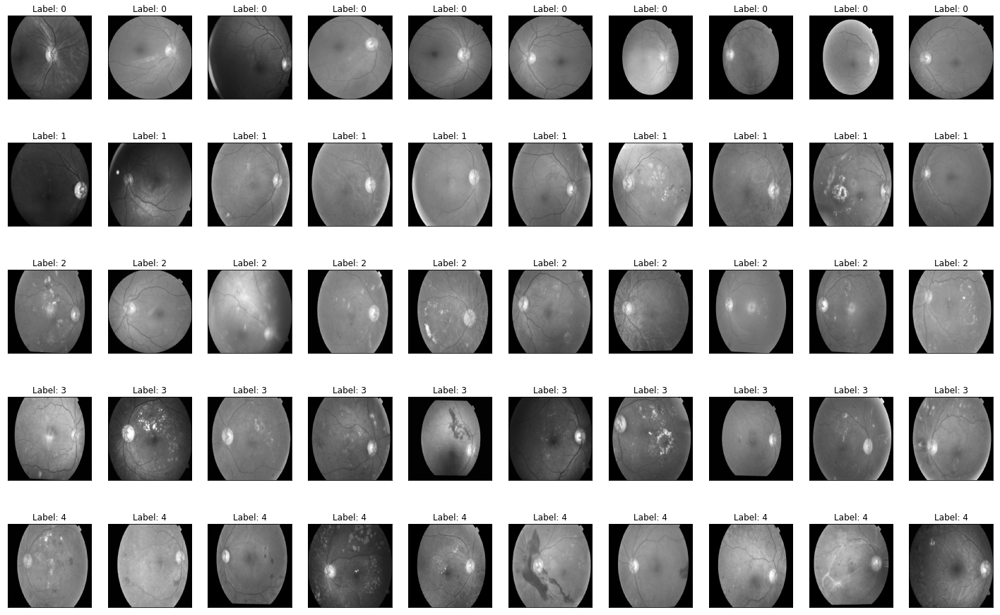

In [20]:
# GaussianBlurで輪郭強調
IMG_SIZE = 512
fig = plt.figure(figsize=(25, 16))
for class_ids in sorted(train['diagnosis'].unique()):
    for i, (idx, row) in enumerate(train.loc[train.diagnosis==class_ids].sample(10, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, 10, class_ids*10+i+1, xticks=[], yticks=[])
        im = cv2.imread(f'../input/aptos2019-blindness-detection/train_images/{row["id_code"]}.png')
        im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
        # 画像サイズを指定サイズ（=IMG_SIZE）に変更します
        im = cv2.resize(im, (IMG_SIZE, IMG_SIZE))
        # ガウシアンフィルターをかけてみます（ガウシアンフィルタは白色ノイズを除去できる）
        im = cv2.GaussianBlur(im, (5, 5), IMG_SIZE/10)
        plt.imshow(im, cmap='gray')
        ax.set_title(f'Label: {class_ids}')

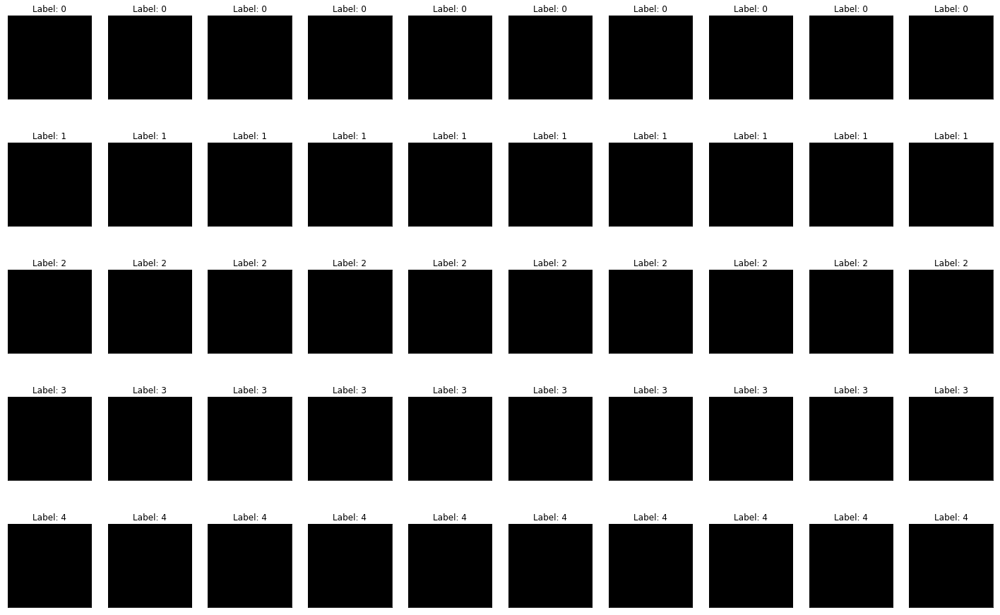

In [21]:
# GaussianBlurで輪郭強調
IMG_SIZE = 512
fig = plt.figure(figsize=(25, 16))
for class_ids in sorted(train['diagnosis'].unique()):
    for i, (idx, row) in enumerate(train.loc[train.diagnosis==class_ids].sample(10, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, 10, class_ids*10+i+1, xticks=[], yticks=[])
        im = cv2.imread(f'../input/aptos2019-blindness-detection/train_images/{row["id_code"]}.png')
        im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
        # 画像サイズを指定サイズ（=IMG_SIZE）に変更します
        im = cv2.resize(im, (IMG_SIZE, IMG_SIZE))
        # cv2.addWeightedで画像を重みをつけて足し合わせることができる
        # 元画像に4の重み、ガウシアンフィルタで平滑化した画像に-4の重みをつけて足し合わせます
        im = cv2.addWeighted(im, 4, cv2.GaussianBlur(im, (1, 1), IMG_SIZE/10), -4, 128)
        plt.imshow(im, cmap='gray')
        ax.set_title(f'Label: {class_ids}')

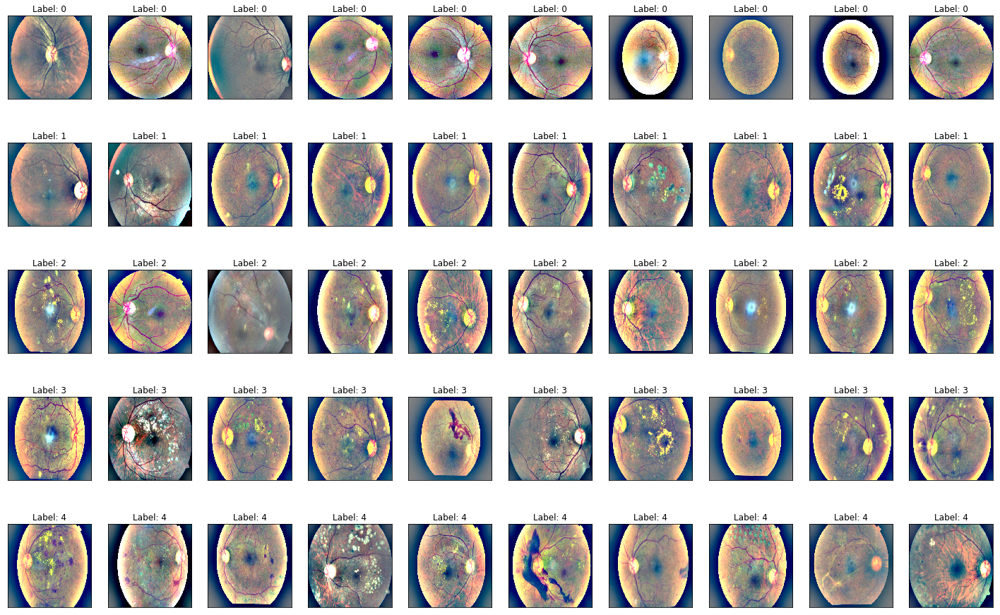

In [22]:
# GaussianBlurで輪郭強調
IMG_SIZE = 512
fig = plt.figure(figsize=(25, 16))
for class_ids in sorted(train['diagnosis'].unique()):
    for i, (idx, row) in enumerate(train.loc[train.diagnosis==class_ids].sample(10, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, 10, class_ids*10+i+1, xticks=[], yticks=[])
        im = cv2.imread(f'../input/aptos2019-blindness-detection/train_images/{row["id_code"]}.png')
        im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
        im = cv2.resize(im, (IMG_SIZE, IMG_SIZE))
        im = cv2.addWeighted(im, 4, cv2.GaussianBlur(im, (0, 0), IMG_SIZE/10), -4, 128)
        plt.imshow(im, cmap='gray')
        ax.set_title(f'Label: {class_ids}')

In [23]:
img = cv2.imread('../input/aptos2019-blindness-detection/train_images/001639a390f0.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# plt.imshow(img, cmap='gray')

In [24]:
img.shape

(2136, 3216)

In [25]:
img.ndim

2

In [26]:
img

array([[2, 2, 2, ..., 1, 1, 1],
       [2, 2, 2, ..., 1, 1, 1],
       [2, 2, 2, ..., 1, 1, 1],
       ...,
       [1, 1, 1, ..., 2, 2, 2],
       [1, 1, 1, ..., 2, 2, 2],
       [1, 1, 1, ..., 2, 2, 2]], dtype=uint8)

In [27]:
# tol = 1
# img > tol
# mask = img > tol
# mask.any(1)

In [28]:
# mask.any(0)

In [29]:
# np.ix_(mask.any(1), mask.any(0))

In [30]:
mask = img>7
img[np.ix_(mask.any(1), mask.any(0))]

array([[2, 2, 2, ..., 2, 2, 2],
       [2, 2, 2, ..., 2, 2, 2],
       [2, 2, 2, ..., 2, 2, 2],
       ...,
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1]], dtype=uint8)

In [31]:
print(mask.any(axis=1))
print(mask.any(axis=0))

[ True  True  True ...  True  True  True]
[False False False ... False False False]


In [32]:
np.ix_(mask.any(axis=1), mask.any(axis=0))

(array([[   0],
        [   1],
        [   2],
        ...,
        [2133],
        [2134],
        [2135]]),
 array([[ 353,  354,  355, ..., 3065, 3070, 3071]]))

In [33]:
img[np.ix_(mask.any(axis=1), mask.any(axis=0))]

array([[2, 2, 2, ..., 2, 2, 2],
       [2, 2, 2, ..., 2, 2, 2],
       [2, 2, 2, ..., 2, 2, 2],
       ...,
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1]], dtype=uint8)

In [34]:
# 縦方向にみて、どれかTrueならTrue
mask.any(axis=1)

array([ True,  True,  True, ...,  True,  True,  True])

In [35]:
# 横方向に見て、どれかTrueならTrue
mask.any(axis=0)

array([False, False, False, ..., False, False, False])

In [36]:
mask

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [37]:
img

array([[2, 2, 2, ..., 1, 1, 1],
       [2, 2, 2, ..., 1, 1, 1],
       [2, 2, 2, ..., 1, 1, 1],
       ...,
       [1, 1, 1, ..., 2, 2, 2],
       [1, 1, 1, ..., 2, 2, 2],
       [1, 1, 1, ..., 2, 2, 2]], dtype=uint8)

In [38]:
def crop_image(img, tol=7):
    if img.ndim == 2:
        mask = img>tol
        return img[np.ix_(mask.any(1), mask.any(0))]
    elif img.ndim==3:
        gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        mask = gray_img>tol
        
        check_shape = img[:, :, 0][np.ix_(mask.any(1), mask.any(0))].shape[0]
        if (check_shape==0):
            return img
        else:
            img1=img[:,:,0][np.ix_(mask.any(1), mask.any(0))]
            img2=img[:,:,1][np.ix_(mask.any(1), mask.any(0))]
            img3=img[:,:,2][np.ix_(mask.any(1), mask.any(0))]
            img = np.stack([img1, img2, img3], axis=-1)
        return img

In [39]:
img = cv2.imread('../input/aptos2019-blindness-detection/train_images/001639a390f0.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
print(img.shape)
img = crop_image(img)
print(img.shape)

(2136, 3216, 3)
(2136, 2715, 3)


In [40]:
img = cv2.addWeighted(img, 4, cv2.GaussianBlur(img, (0, 0), 10), -4, 128)

In [41]:
img.shape

(2136, 2715, 3)

In [42]:
height, width, depth = img.shape

In [43]:
height

2136

In [44]:
# 最小値を抜き出す
x = int(width/2)
y = int(height/2)
# 最小値を抜き出す
r = np.amin((x, y))
print("x: ", x)
print("y: ", y)
print("r: ", r)

x:  1357
y:  1068
r:  1068


In [45]:
circle_img = np.zeros((height, width), np.uint8)
print(circle_img.shape)
circle_img

(2136, 2715)


array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [46]:
# (x, y): 円の中心
# r: 円の半径
# thickness: 円の枠線の太さ(負の値の場合は円が塗りつぶされる)
cv2.circle(circle_img, (x, y), int(r), 1, thickness=-1)

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [47]:
circle_img[1350: 1360, 1060:1070]

array([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1]], dtype=uint8)

In [48]:
img = cv2.bitwise_and(img, img, mask=circle_img)
print(img.shape)

(2136, 2715, 3)


In [49]:
print(train.shape)
print(test.shape)
print(train.shape)


(3662, 2)
(1928, 1)
(3662, 2)


In [50]:
def crop_image_from_gray(img, tol=7):
    if img.ndim == 2:
        mask = img>tol
        return img[np.ix_(mask.any(1), mask.any(0))]
    elif img.ndim==3:
        gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        mask = gray_img>tol
        
        check_shape = img[:, :, 0][np.ix_(mask.any(1), mask.any(0))].shape[0]
        if (check_shape==0):
            return img
        else:
            img1=img[:,:,0][np.ix_(mask.any(1), mask.any(0))]
            img2=img[:,:,1][np.ix_(mask.any(1), mask.any(0))]
            img3=img[:,:,2][np.ix_(mask.any(1), mask.any(0))]
            img = np.stack([img1, img2, img3], axis=-1)
        return img

In [51]:
def load_ben_color(path, sigmaX=10):
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = crop_image_from_gray(image)
    image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
    image = cv2.addWeighted(image, 4, cv2.GaussianBlur(image, (0, 0), sigmaX), -4, 128)
    
    return image

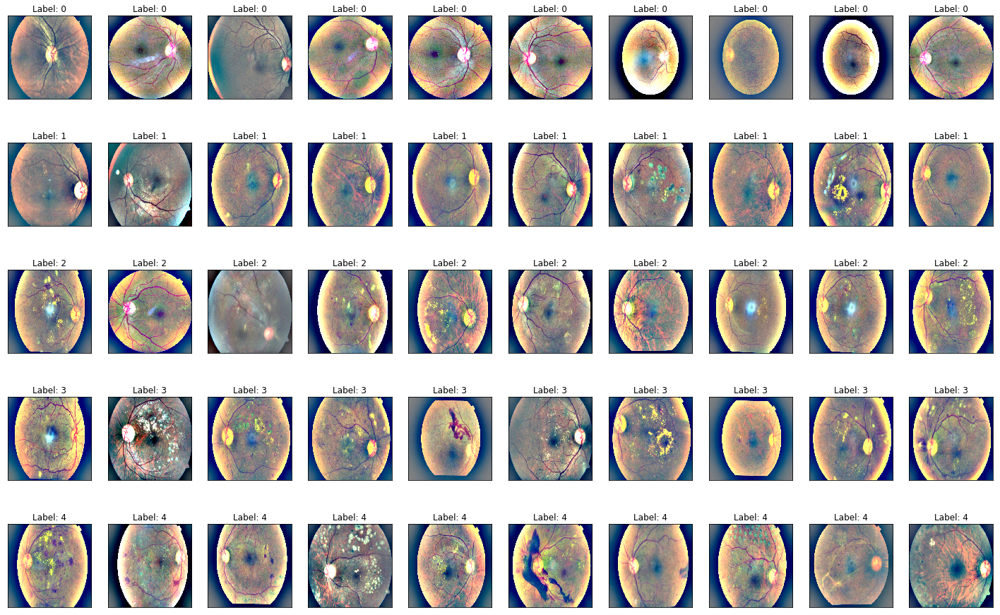

In [52]:
# GaussianBlurで輪郭強調
IMG_SIZE = 512
fig = plt.figure(figsize=(25, 16))
for class_ids in sorted(train['diagnosis'].unique()):
    for i, (idx, row) in enumerate(train.loc[train.diagnosis==class_ids].sample(10, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, 10, class_ids*10+i+1, xticks=[], yticks=[])
        im = cv2.imread(f'../input/aptos2019-blindness-detection/train_images/{row["id_code"]}.png')
        im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
        im = cv2.resize(im, (IMG_SIZE, IMG_SIZE))
        im = cv2.addWeighted(im, 4, cv2.GaussianBlur(im, (0, 0), IMG_SIZE/10), -4, 128)
        plt.imshow(im, cmap='gray')
        ax.set_title(f'Label: {class_ids}')

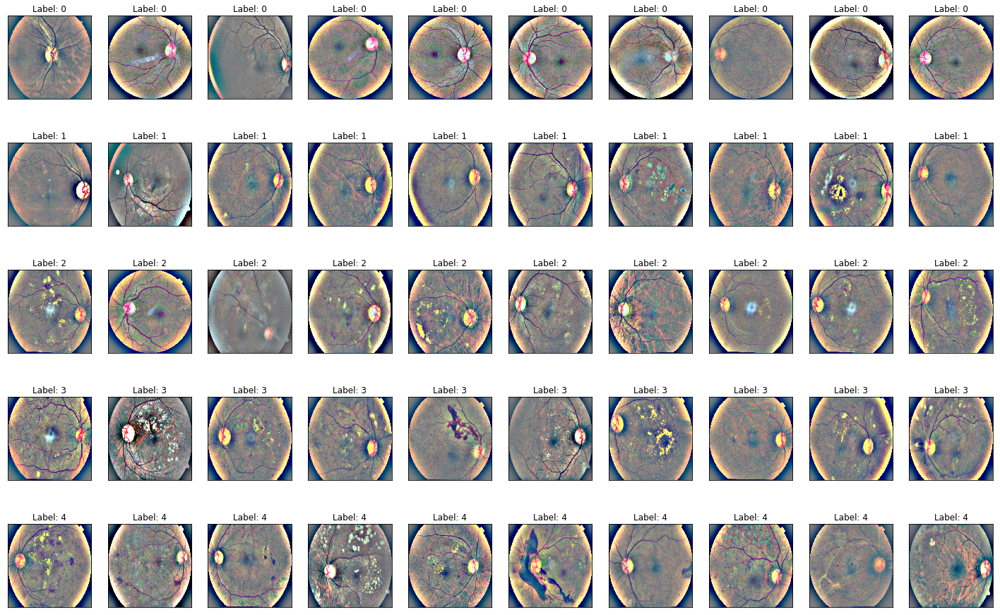

In [53]:
# GaussianBlurで輪郭強調
IMG_SIZE = 512
fig = plt.figure(figsize=(25, 16))
for class_ids in sorted(train['diagnosis'].unique()):
    for i, (idx, row) in enumerate(train.loc[train.diagnosis==class_ids].sample(10, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, 10, class_ids*10+i+1, xticks=[], yticks=[])
        im = load_ben_color(f'../input/aptos2019-blindness-detection/train_images/{row["id_code"]}.png', sigmaX=30)
        plt.imshow(im, cmap='gray')
        ax.set_title(f'Label: {class_ids}')